In [1]:
import os

import pandas as pd
import cv2
import matplotlib.pyplot as plt

In [2]:
!ls tmp/coins_image_regression

coins_image_regression.csv images


In [3]:
d = pd.read_csv('tmp/coins_image_regression/coins_image_regression.csv')
print(d.shape)
d.head()

(6028, 3)


,image_path,label,fold
0,105_1479344562.jpg,105,1
1,105_1479344940.jpg,105,2
2,125_1479424716.jpg,125,1
3,90_1477856976.jpg,90,0
4,50_1477283274.jpg,50,2


In [4]:
d['label'].describe()

count    6028.000000
mean       62.962840
std        44.739969
min         5.000000
25%        25.000000
50%        55.000000
75%       100.000000
max       175.000000
Name: label, dtype: float64

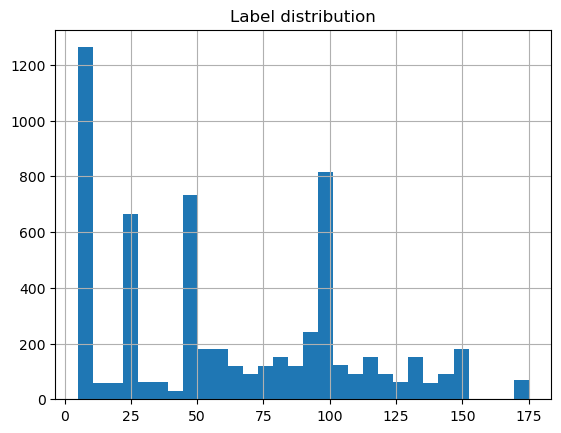

In [5]:
d['label'].hist(bins=30)
plt.title('Label distribution')
plt.show()

In [7]:
d['label'].value_counts().sort_index()

5      600
10     663
15      60
20      60
25     665
30      62
35      61
40      31
45      91
50     642
55     180
60     181
65     120
70      90
75     121
80     151
85     121
90     152
95      91
100    816
105    122
110     92
115    151
120     92
125     61
130     92
135     61
140     60
145     90
150    180
170     30
175     39
Name: label, dtype: int64

In [9]:
d['image_path'].nunique()   # 画像枚数

6028

In [10]:
H, W, C = [], [], []
v_mean, v_min, v_max = [], [], []
im_pathes = []
for f in d['image_path']:
    im_path = os.path.join('tmp', 'coins_image_regression', 'images', f)
    im_pathes.append(im_path)
    im = cv2.imread(im_path)
    H.append(im.shape[0])
    W.append(im.shape[1])
    C.append(im.shape[2])
    v_mean.append(im.mean())
    v_min.append(im.min()*1.0)
    v_max.append(im.max()*1.0)
df_shape = pd.DataFrame({'H':H, 'W':W, 'C':C, 'val_mean':v_mean, 'val_min':v_min, 'val_max':v_max})
df_shape.shape

(6028, 6)

In [11]:
im[0]

array([[ 87,  81,  68],
       [ 93,  87,  74],
       [ 99,  93,  80],
       ...,
       [129, 135, 130],
       [129, 135, 130],
       [128, 134, 129]], dtype=uint8)

In [12]:
df_shape

,H,W,C,val_mean,val_min,val_max
0,480,640,3,146.434158,0.0,255.0
1,480,640,3,133.024978,0.0,192.0
2,480,640,3,134.934844,0.0,255.0
3,480,640,3,146.661145,0.0,255.0
4,480,640,3,130.050595,0.0,249.0
...,...,...,...,...,...,...
6023,480,640,3,131.138210,0.0,255.0
6024,480,640,3,138.774517,0.0,255.0
6025,480,640,3,129.761905,0.0,192.0
6026,480,640,3,137.385854,0.0,255.0


In [20]:
df_shape.describe()

,H,W,C,val_mean,val_min,val_max
count,6028.0,6028.0,6028.0,6028.000000,6028.000000,6028.000000
mean,480.0,640.0,3.0,137.871317,0.012940,239.419708
std,0.0,0.0,0.0,9.055813,1.004634,27.906794
min,480.0,640.0,3.0,69.688091,0.000000,119.000000
25%,480.0,640.0,3.0,132.184464,0.000000,236.000000
50%,480.0,640.0,3.0,135.059092,0.000000,255.000000
75%,480.0,640.0,3.0,142.806332,0.000000,255.000000
max,480.0,640.0,3.0,181.745654,78.000000,255.000000


画像サイズ（全て同じ）： (H, W, C) = (480, 640, 3)

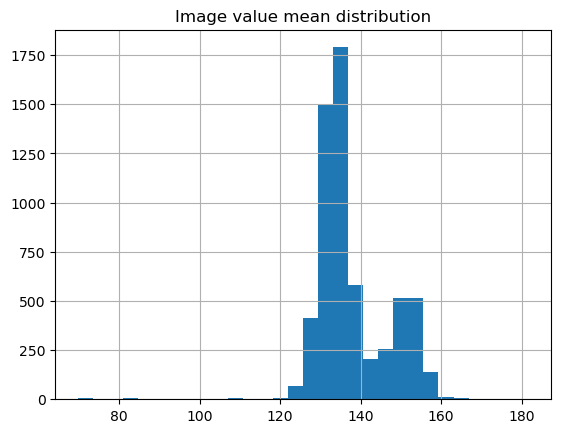

In [16]:
df_shape['val_mean'].hist(bins=30)
plt.title('Image value mean distribution')
plt.show()

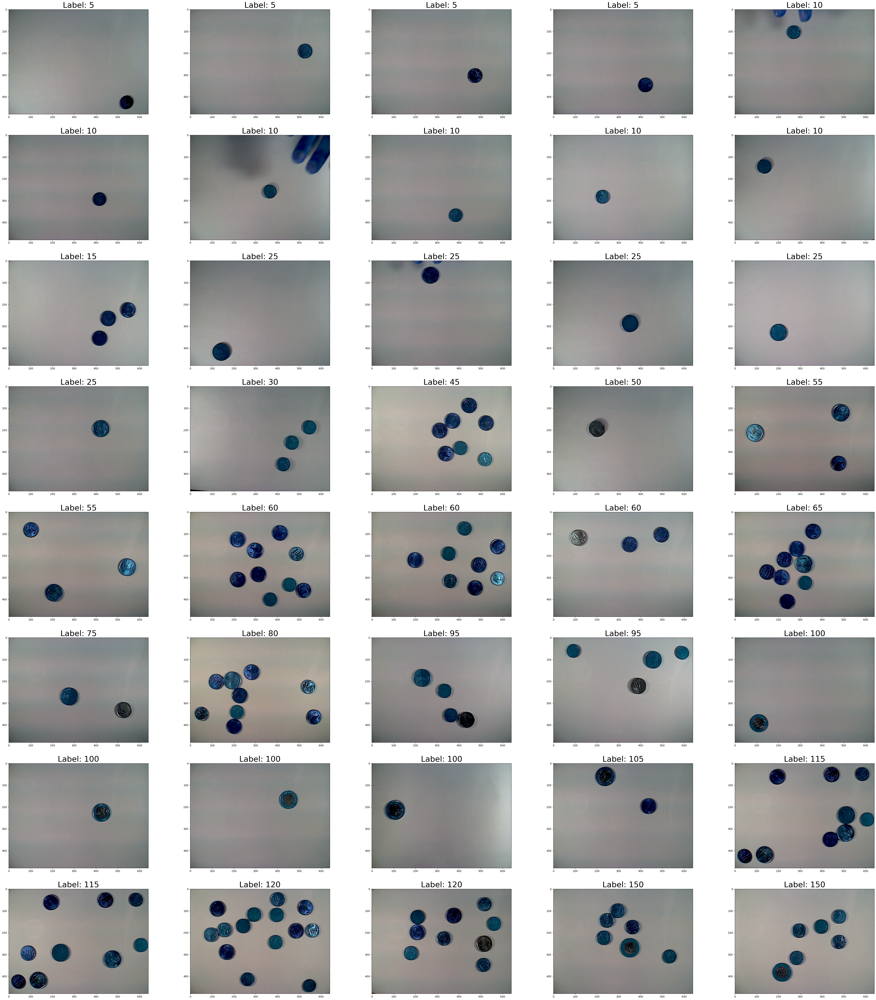

In [43]:
N = 40
d_samples = d.sample(N)
d_samples = d_samples.sort_values('label')

### プロット
fig = plt.figure(figsize=(60, 180))
counter = 1
for _, r in d_samples.iterrows():
    ax = fig.add_subplot((N//2)+1, 5, counter)
    ax.set_title(f"Label: {r['label']}", fontsize=30)
    im = cv2.imread(os.path.join('tmp', 'coins_image_regression', 'images', r['image_path']))
    plt.imshow(im)
    counter += 1